<a href="https://colab.research.google.com/github/Bikash1710/JPMCAIMLBatch1Group1CapSt/blob/main/Capstone_Proj_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# IMPORT DATA
import pandas as pd
import numpy as np

data = pd.read_excel('/content/drive/My Drive/data/input_data.xlsx')

data.head()

,Short description,Description,Caller,Assignment group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,_x000D_\n_x000D_\nreceived from: hmjdrvpb.komu...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,_x000D_\n_x000D_\nreceived from: eylqgodm.ybqk...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


In [3]:
data.rename(columns={"Short description":"Short_description","Assignment group":"Assignment_group"},inplace=True)
data.head()

,Short_description,Description,Caller,Assignment_group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,_x000D_\n_x000D_\nreceived from: hmjdrvpb.komu...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,_x000D_\n_x000D_\nreceived from: eylqgodm.ybqk...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


In [4]:
def cleanse(text):
      text0=str(text)
      text1=text0.replace('_x000D_',' ')
      text2=text1.replace('@gmail.com',' ')
      text3=text2.replace('.',' ')
      text4=text3.replace('@company.com',' ')
      return text4

In [5]:
data['Description']=data['Description'].apply(cleanse)

In [6]:
data.head()

,Short_description,Description,Caller,Assignment_group
0,login issue,-verified user details (employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,\n \nreceived from: hmjdrvpb komuaywn \n \nh...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,\n \nreceived from: eylqgodm ybqkwiam \n \nh...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


In [7]:
print(data.Assignment_group.value_counts())

GRP_0     3976
GRP_8      661
GRP_24     289
GRP_12     257
GRP_9      252
          ... 
GRP_64       1
GRP_67       1
GRP_35       1
GRP_70       1
GRP_73       1
Name: Assignment_group, Length: 74, dtype: int64


In [8]:
pip install langdetect

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 981 kB 7.9 MB/s 
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993242 sha256=64abe8345d9e727d3d8557786b0dd63f5e5516d404800e9b1f170a63bafed902
  Stored in directory: /root/.cache/pip/wheels/c5/96/8a/f90c59ed25d75e50a8c10a1b1c2d4c402e4dacfa87f3aff36a
Successfully built langdetect


In [9]:
from langdetect import detect

In [10]:
Row_list =[]
  
for index, rows in data.iterrows():
    my_list =str(rows.Short_description) +" " + str(rows.Description)
    Row_list.append(my_list)

In [11]:
se = pd.Series(Row_list)
data['All_description'] = se.values

In [12]:
data.head()

,Short_description,Description,Caller,Assignment_group,All_description
0,login issue,-verified user details (employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details (employee# ...
1,outlook,\n \nreceived from: hmjdrvpb komuaywn \n \nh...,hmjdrvpb komuaywn,GRP_0,outlook \n \nreceived from: hmjdrvpb komuaywn...
2,cant log in to vpn,\n \nreceived from: eylqgodm ybqkwiam \n \nh...,eylqgodm ybqkwiam,GRP_0,cant log in to vpn \n \nreceived from: eylqgo...
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page unable to access...
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error


In [13]:
Row_list =[]

for index, rows in data.iterrows():
    try:
        language = detect(rows.All_description)
    except:
        language = "error"
    Row_list.append(language)

In [14]:
se = pd.Series(Row_list)
data['lang'] = se.values

In [15]:
data.head()

,Short_description,Description,Caller,Assignment_group,All_description,lang
0,login issue,-verified user details (employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details (employee# ...,en
1,outlook,\n \nreceived from: hmjdrvpb komuaywn \n \nh...,hmjdrvpb komuaywn,GRP_0,outlook \n \nreceived from: hmjdrvpb komuaywn...,en
2,cant log in to vpn,\n \nreceived from: eylqgodm ybqkwiam \n \nh...,eylqgodm ybqkwiam,GRP_0,cant log in to vpn \n \nreceived from: eylqgo...,en
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page unable to access...,en
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error,no


In [16]:

print(data.lang.value_counts())

en    7076
de     382
af     257
it     131
fr     123
no      76
nl      75
sv      74
da      74
ca      50
es      48
pt      25
pl      25
tl      12
sq      11
cy      10
ro      10
hr       7
fi       6
tr       6
sl       5
et       5
id       4
cs       2
so       2
lt       2
hu       1
sk       1
Name: lang, dtype: int64


In [17]:
pd.crosstab(index=data['lang'], columns=data['Assignment_group'])

Assignment_group,GRP_0,GRP_1,GRP_10,GRP_11,GRP_12,GRP_13,GRP_14,GRP_15,GRP_16,GRP_17,...,GRP_67,GRP_68,GRP_69,GRP_7,GRP_70,GRP_71,GRP_72,GRP_73,GRP_8,GRP_9
lang,,,,,,,,,,,,,,,,,,,,,
af,224,0,0,0,2,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
ca,21,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
cs,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
cy,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
da,19,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
de,105,0,3,1,25,2,2,0,1,0,...,0,0,0,0,0,0,0,0,0,0
en,3187,29,135,29,222,140,113,37,83,78,...,1,3,2,67,1,2,2,1,659,249
es,36,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
et,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [18]:
data2=data[data['lang']=='de'][['Short_description','Description']]


In [19]:
from google.colab import files

data2.to_csv('output.csv', encoding = 'utf-8-sig') 
files.download('output.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [20]:
data2=data[data['lang']=='af'][['Short_description','Description']]

In [21]:
from google.colab import files

data2.to_csv('output.csv', encoding = 'utf-8-sig') 
files.download('output.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [22]:
data2=data[data['lang']=='it'][['Short_description','Description']]

In [23]:
from google.colab import files

data2.to_csv('output.csv', encoding = 'utf-8-sig') 
files.download('output.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [24]:
data2=data[data['lang']=='fr'][['Short_description','Description']]

In [25]:
from google.colab import files

data2.to_csv('output.csv', encoding = 'utf-8-sig') 
files.download('output.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [26]:
data2=data[data['lang']=='no'][['Short_description','Description']]

In [27]:
from google.colab import files

data2.to_csv('output.csv', encoding = 'utf-8-sig') 
files.download('output.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [28]:
data_eng=data[data['lang']!='de']

In [29]:
name_list=data['Caller'].str.split().to_list()
print(name_list)

[['spxjnwir', 'pjlcoqds'], ['hmjdrvpb', 'komuaywn'], ['eylqgodm', 'ybqkwiam'], ['xbkucsvz', 'gcpydteq'], ['owlgqjme', 'qhcozdfx'], ['eflahbxn', 'ltdgrvkz'], ['jyoqwxhz', 'clhxsoqy'], ['eqzibjhw', 'ymebpoih'], ['mdbegvct', 'dbvichlg'], ['fumkcsji', 'sarmtlhy'], ['badgknqs', 'xwelumfz'], ['dcqsolkx', 'kmsijcuz'], ['oblekmrw', 'qltgvspb'], ['iftldbmu', 'fujslwby'], ['epwyvjsz', 'najukwho'], ['fumkcsji', 'sarmtlhy'], ['chobktqj', 'qdamxfuc'], ['sigfdwcj', 'reofwzlm'], ['nqdyowsm', 'yqerwtna'], ['ftsqkvre', 'bqzrupic'], ['mrzgjdal', 'whnldmef'], ['ugephfta', 'hrbqkvij'], ['pfmcnahv', 'ofzlusri'], ['fumkcsji', 'sarmtlhy'], ['dceoufyz', 'saufqkmd'], ['jqhtkfsm', 'xoehtbnl'], ['dtisfuyp', 'fpvrjlkz'], ['lduqxywt', 'wcydjgvl'], ['mwebfhdz', 'csndrxgi'], ['hvskpglx', 'bpsfxmon'], ['wrlzneit', 'ayqutwgh'], ['qcehailo', 'wqynckxg'], ['kxsceyzo', 'naokumlb'], ['fsqwkbez', 'eudsantq'], ['xzbhmfpg', 'bhqxesym'], ['eqzibjhw', 'ymebpoih'], ['ztlvkmyi', 'xldyitwz'], ['shloyakw', 'jztsxdln'], ['qcxivzag'

In [30]:
import itertools
names_all=list(itertools.chain.from_iterable(list(name_list)))


In [31]:
import nltk
from string import punctuation
from nltk.corpus import stopwords
from nltk import word_tokenize
nltk.download('punkt')
nltk.download('stopwords')
stop_words = stopwords.words('english') + list(punctuation)+names_all
 
def tokenize(text):
    words = word_tokenize(text)
    words = [w.lower() for w in words]
    return ' '.join([w for w in words if w not in stop_words and not w.isdigit()])

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [32]:
data_eng['Short_description1']=data_eng['Short_description'].apply(str)
data_eng['Short_description1']=data_eng['Short_description1'].apply(tokenize)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [33]:
data_eng.head()

,Short_description,Description,Caller,Assignment_group,All_description,lang,Short_description1
0,login issue,-verified user details (employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details (employee# ...,en,login issue
1,outlook,\n \nreceived from: hmjdrvpb komuaywn \n \nh...,hmjdrvpb komuaywn,GRP_0,outlook \n \nreceived from: hmjdrvpb komuaywn...,en,outlook
2,cant log in to vpn,\n \nreceived from: eylqgodm ybqkwiam \n \nh...,eylqgodm ybqkwiam,GRP_0,cant log in to vpn \n \nreceived from: eylqgo...,en,cant log vpn
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page unable to access...,en,unable access hr_tool page
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error,no,skype error


In [34]:
data_eng['Description1']=data_eng['Description'].apply(str)
data_eng['Description1']=data_eng['Description1'].apply(tokenize)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [35]:
data_eng.head()

,Short_description,Description,Caller,Assignment_group,All_description,lang,Short_description1,Description1
0,login issue,-verified user details (employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details (employee# ...,en,login issue,-verified user details employee manager name -...
1,outlook,\n \nreceived from: hmjdrvpb komuaywn \n \nh...,hmjdrvpb komuaywn,GRP_0,outlook \n \nreceived from: hmjdrvpb komuaywn...,en,outlook,received hello team meetings/skype meetings et...
2,cant log in to vpn,\n \nreceived from: eylqgodm ybqkwiam \n \nh...,eylqgodm ybqkwiam,GRP_0,cant log in to vpn \n \nreceived from: eylqgo...,en,cant log vpn,received hi log vpn best
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page unable to access...,en,unable access hr_tool page,unable access hr_tool page
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error,no,skype error,skype error


In [36]:
dev_data=data_eng.drop(['Short_description','Description','Caller','All_description'],axis=1)
dev_data.head()

,Assignment_group,lang,Short_description1,Description1
0,GRP_0,en,login issue,-verified user details employee manager name -...
1,GRP_0,en,outlook,received hello team meetings/skype meetings et...
2,GRP_0,en,cant log vpn,received hi log vpn best
3,GRP_0,en,unable access hr_tool page,unable access hr_tool page
4,GRP_0,no,skype error,skype error


In [37]:
dev_data.shape

(8118, 4)

In [38]:
word_list=dev_data['Short_description1'].str.split().to_list()

In [39]:
import itertools
words_all=list(itertools.chain.from_iterable(word_list))
print(len(words_all))

40783


In [40]:
words_all_dedup=list(set(words_all))
print(len(words_all_dedup))

7753


In [41]:
word_list=dev_data['Description1'].str.split().to_list()
import itertools
words_all=list(itertools.chain.from_iterable(word_list))
print(len(words_all))
words_all_dedup=list(set(words_all))
print(len(words_all_dedup))
print(words_all_dedup)

151576
18667
['ticket_no0448767', 'admin2-datacenter-switch04', 'lentidã£o', 'kommt', 'preview', 'usa-2950-access-sw02', '9:33', '\\hostname_768\\teams\\proxyâ€¦', 'sits', 'ohâ€¦â€¦', 'izcwuvgo', 'restared', '///\\\\hostname_645\\departments\\personal', 'skype', 'duplicate', 'programdntyme', 'yqddquanw', 're-join', 'nogo', 'installing', 'd4c2e240', '9:45', 'previous', 'vou', 'reddfgymos', 'plant_254', 'wondering', '795a', 'palghjmal1', '®ä¸\x8dèƒ½åœ¨æµ\x8fè§ˆå™¨ç•œé\x9d¢æ˜¾çž°', '___yes______', 'checkoutview', '00:22:00', 'w', 'technician', '5c0b', 'differences', '04:51:00', 'proint', '3dc36813a835f65e', 'branding', 'storch', 'zarthyc', 'mvycfwka', 'grinding', 'gbâ€¦', '19:23:12', '564d', 'sid_792', 'file=emea', 'telekom', '0xf1729be0', 'denial', '7f12', '464e', 'hostname_221', 'dvqtziya', 'fort', 'yidvloun', 'yadavtghya', '/n/dscsag/conv_rule', 'yzeakbrl', 'one', '16:50:00', 'edml8111119/10', 'letyenm', 'band', '2016-09-07', 'stã¶hrmann', 'svchost', 'bowtniuy', '334a', 'powder', '08/2

In [42]:
from google.colab import files

dev_data.to_csv('data_clean_v1.csv', encoding = 'utf-8-sig') 
files.download('data_clean_v1.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

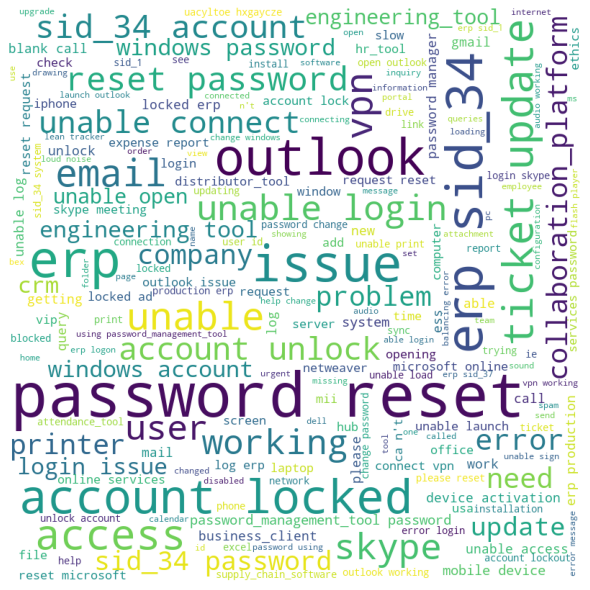

In [43]:

# importing all necessary modules
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

def word_cl(grp):
    desc_words = ''
    stopwords = set(STOPWORDS)
    data_in=dev_data[dev_data['Assignment_group']==grp]


    # iterate through the csv file
    for val in data_in.Short_description1:
        # typecaste each val to string
        val = str(val)
    
        # split the value
        tokens = val.split()
        
        # Converts each token into lowercase
        for i in range(len(tokens)):
            tokens[i] = tokens[i].lower()
        
        desc_words += " ".join(tokens)+" "
    
    wordcloud = WordCloud(width = 800, height = 800,
                    background_color ='white',
                    stopwords = stopwords,
                    min_font_size = 10).generate(desc_words)
    
    # plot the WordCloud image                      
    plt.figure(figsize = (8, 8), facecolor = None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad = 0)
    
    plt.show()

word_cl('GRP_0')

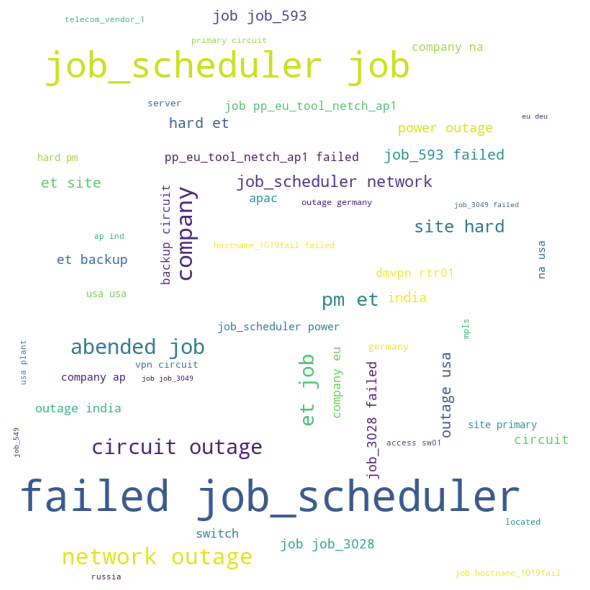

In [44]:
word_cl('GRP_8')

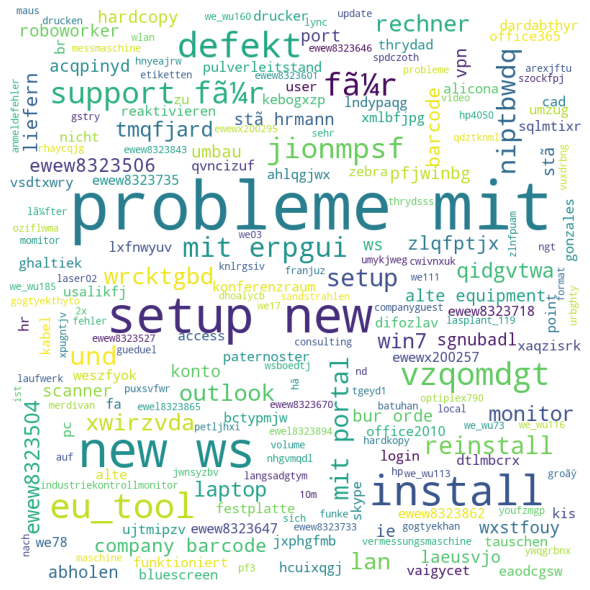

In [45]:
word_cl('GRP_24')

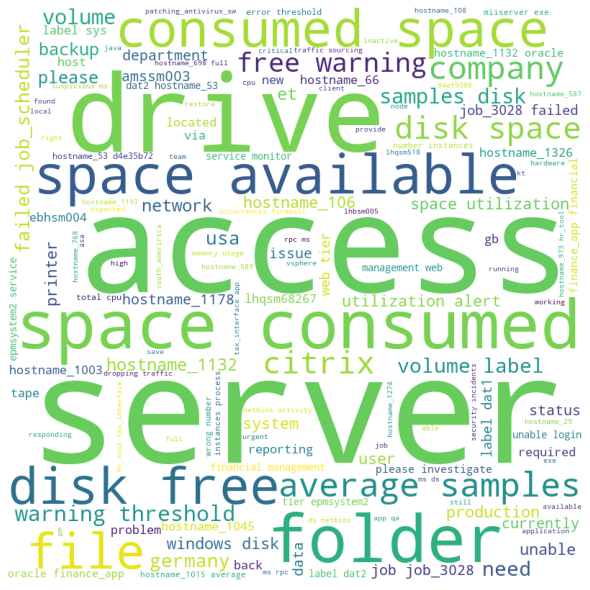

In [46]:
word_cl('GRP_12')

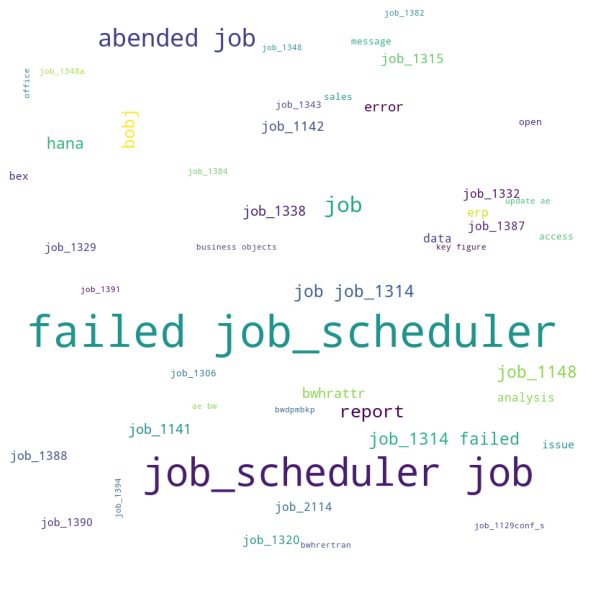

In [47]:
word_cl('GRP_9')

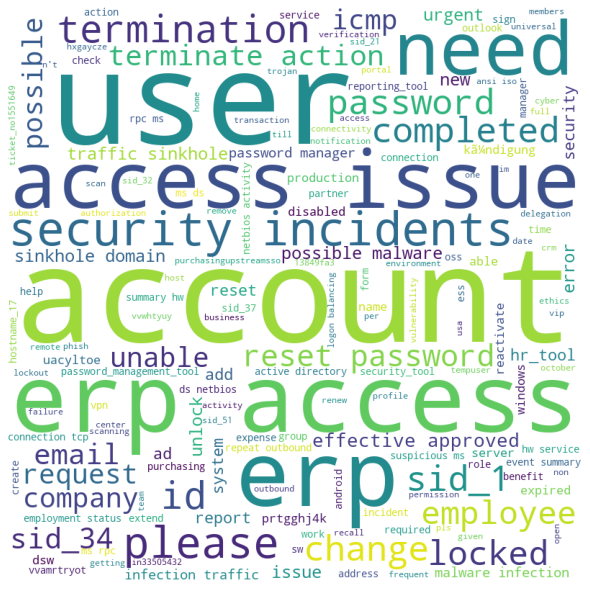

In [48]:
word_cl('GRP_2')

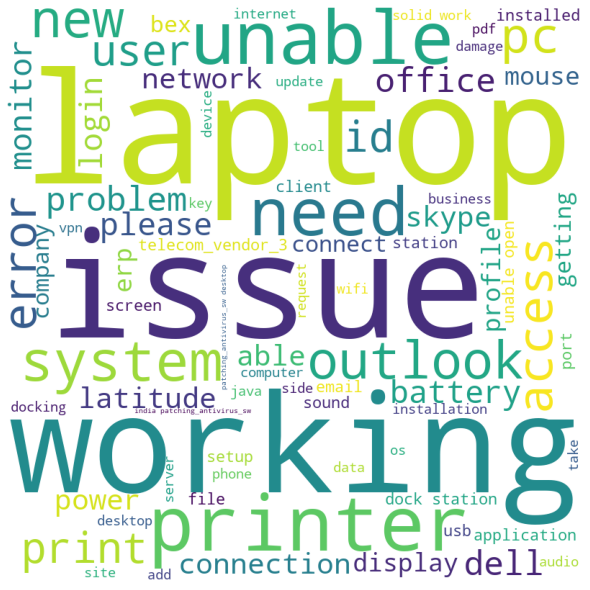

In [49]:
word_cl('GRP_19')

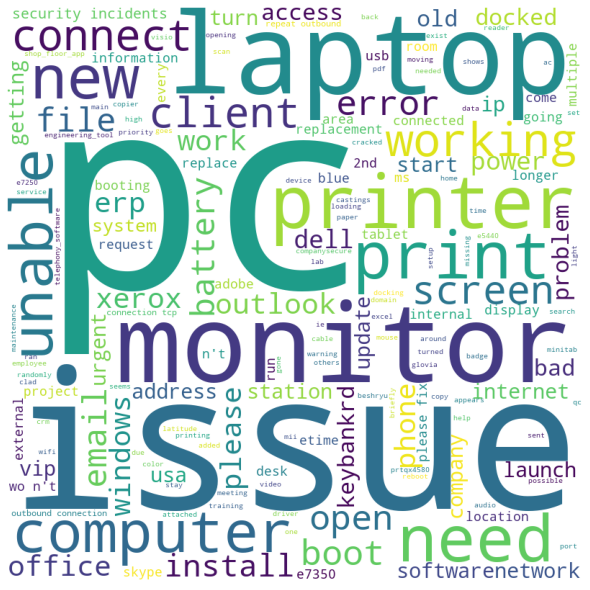

In [50]:
word_cl('GRP_3')

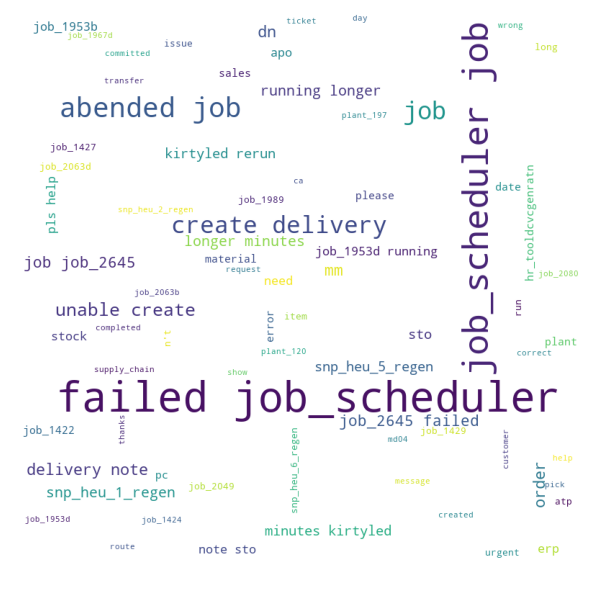

In [51]:
word_cl('GRP_6')

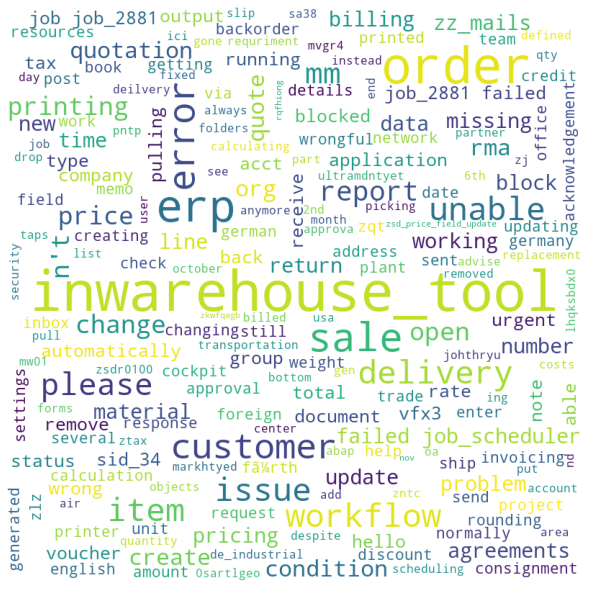

In [52]:
word_cl('GRP_13')

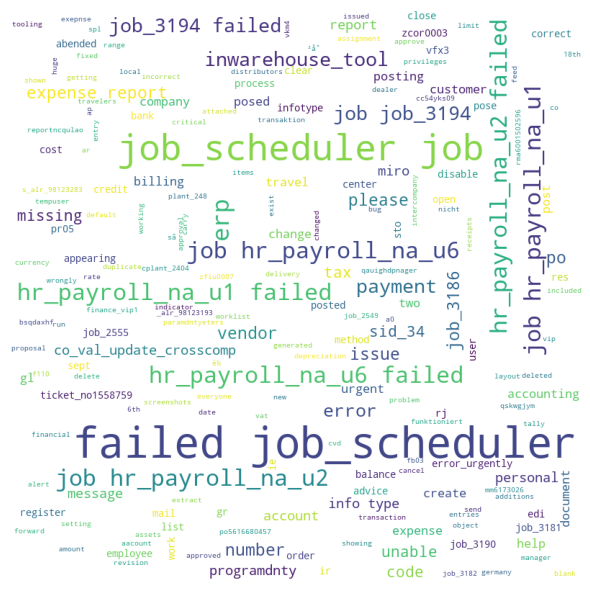

In [53]:
word_cl('GRP_10')

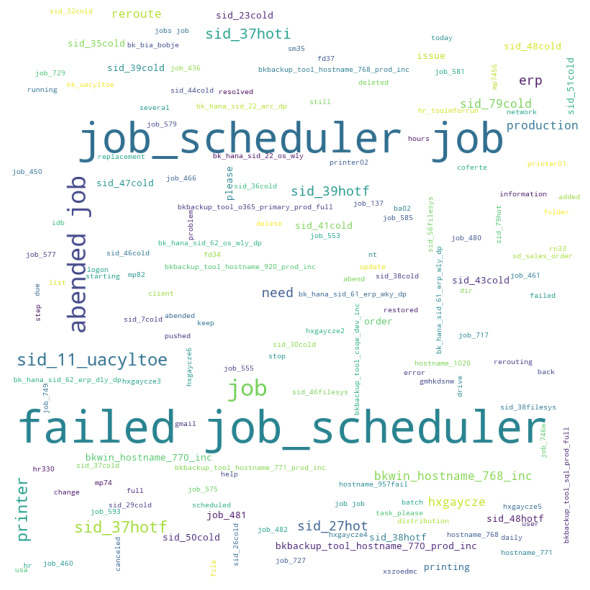

In [54]:
word_cl('GRP_5')

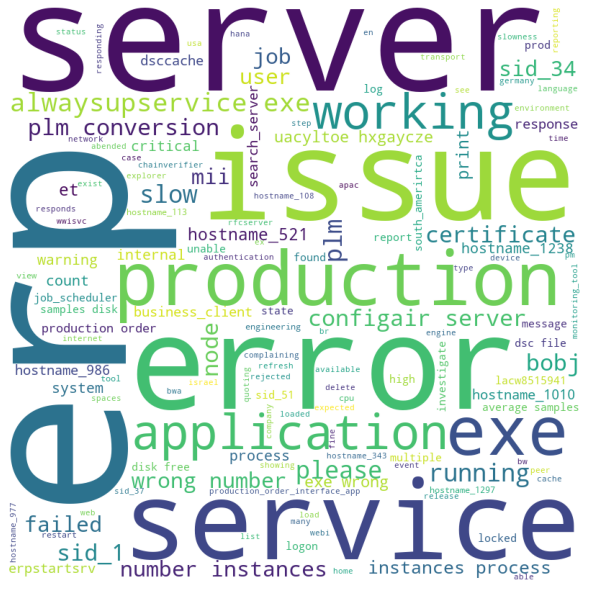

In [55]:
word_cl('GRP_14')

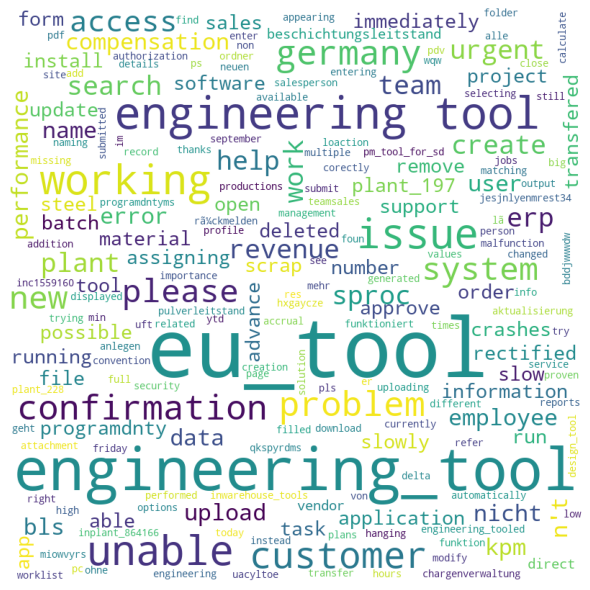

In [56]:
word_cl('GRP_25')

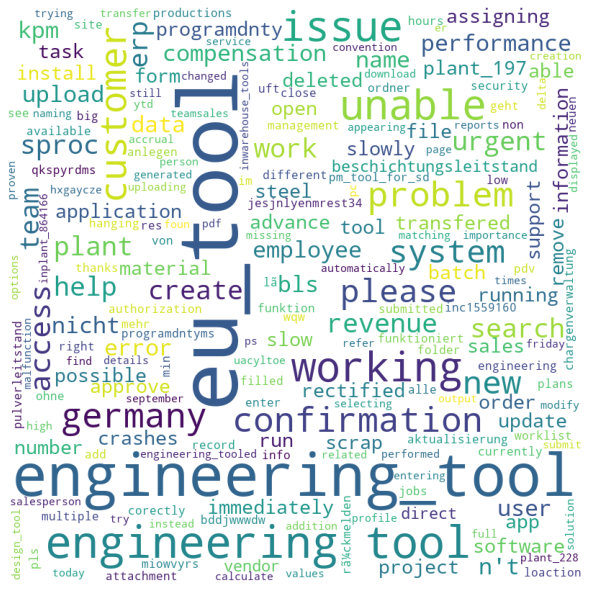

In [57]:
word_cl('GRP_25')

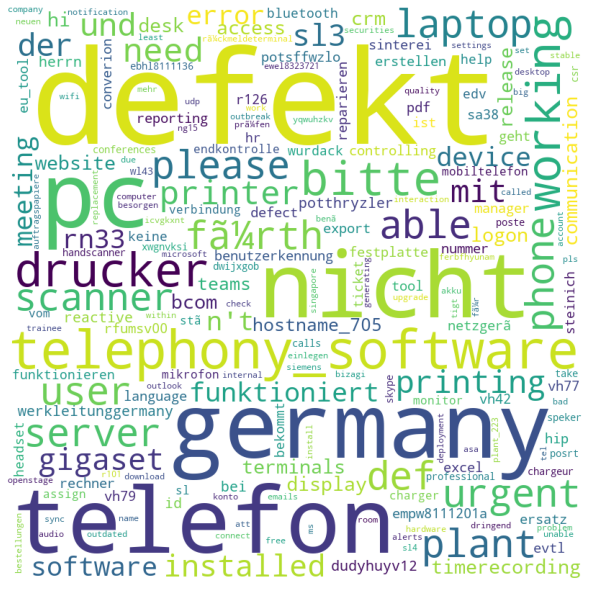

In [58]:
word_cl('GRP_33')

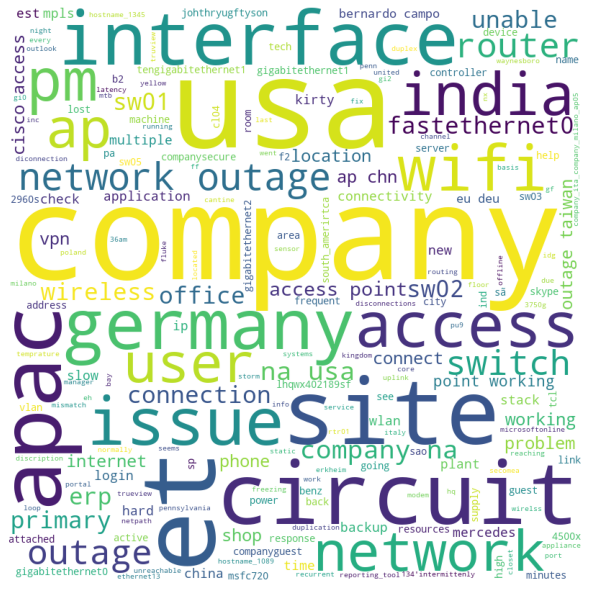

In [59]:
word_cl('GRP_4')

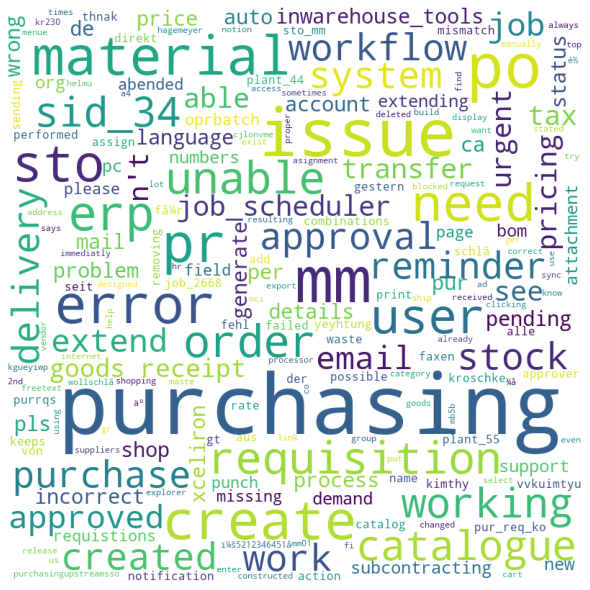

In [60]:
word_cl('GRP_29')

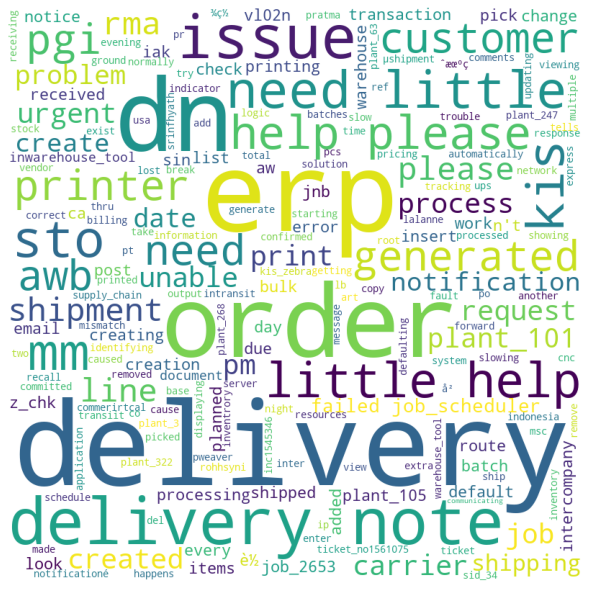

In [61]:
word_cl('GRP_18')

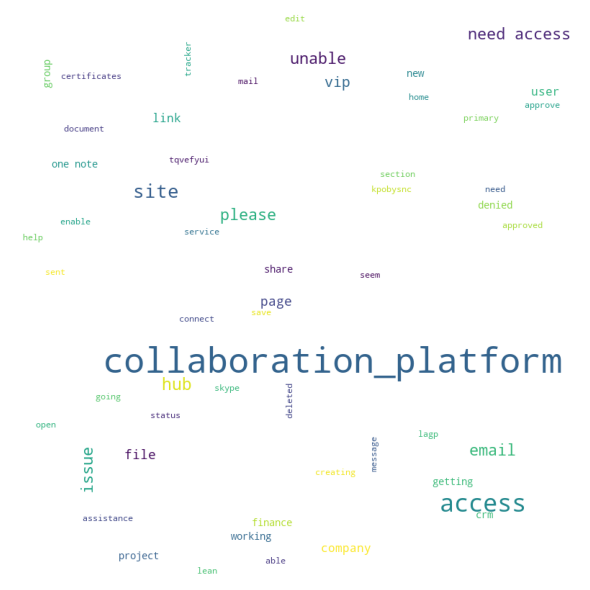

In [62]:
word_cl('GRP_16')

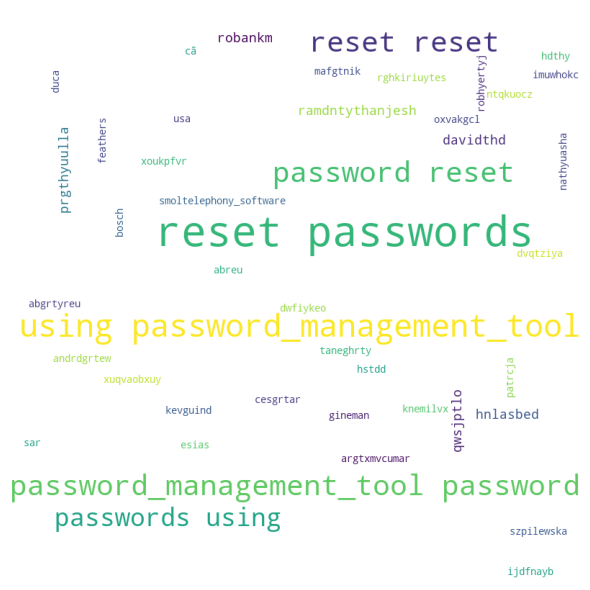

In [63]:
word_cl('GRP_17')

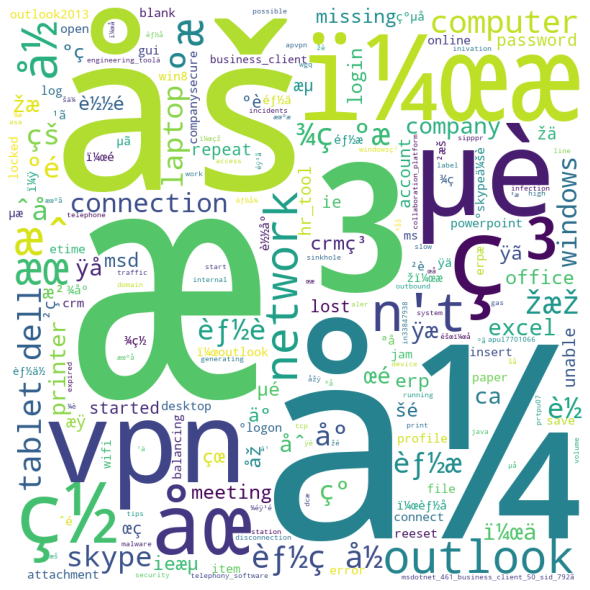

In [64]:
word_cl('GRP_31')

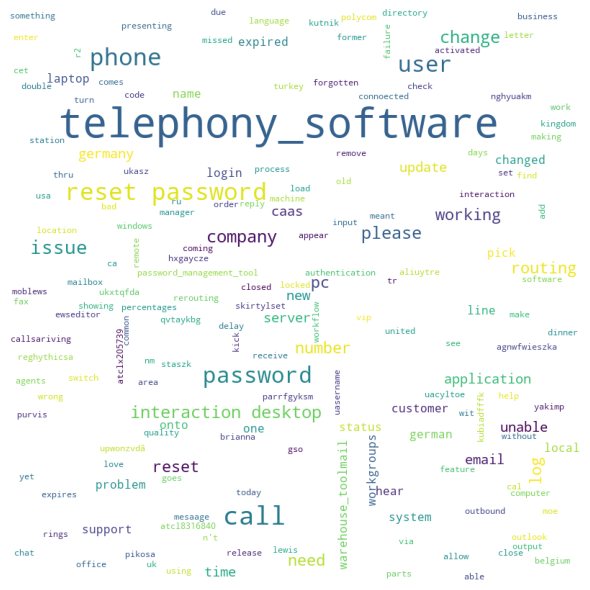

In [65]:
word_cl('GRP_7')

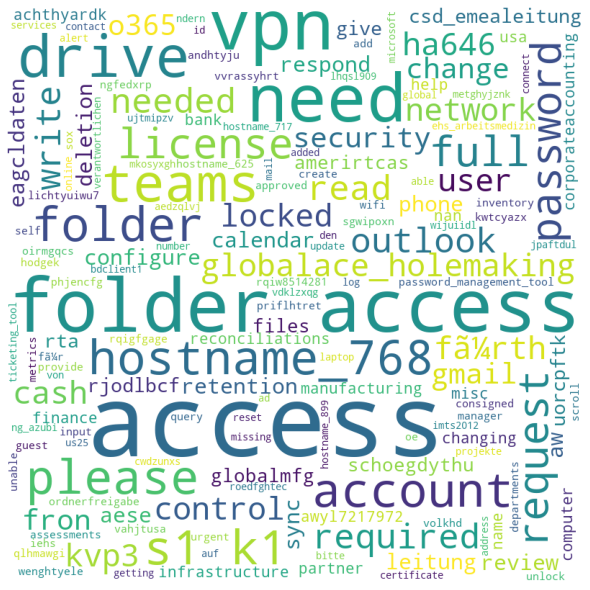

In [66]:
word_cl('GRP_34')

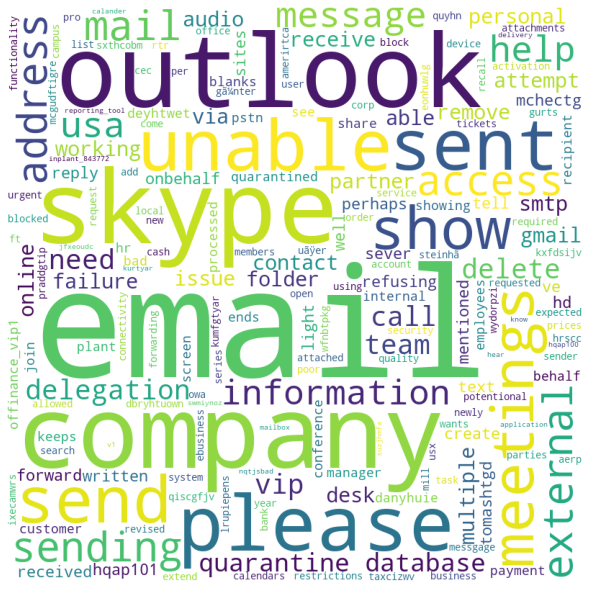

In [67]:
word_cl('GRP_26')

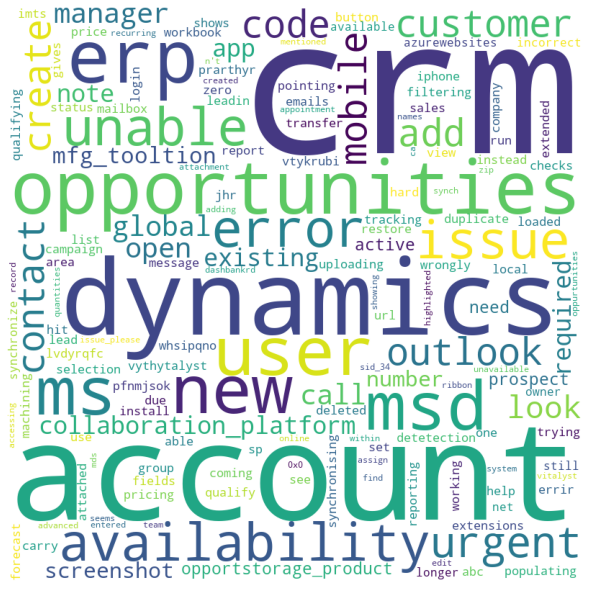

In [68]:
word_cl('GRP_40')

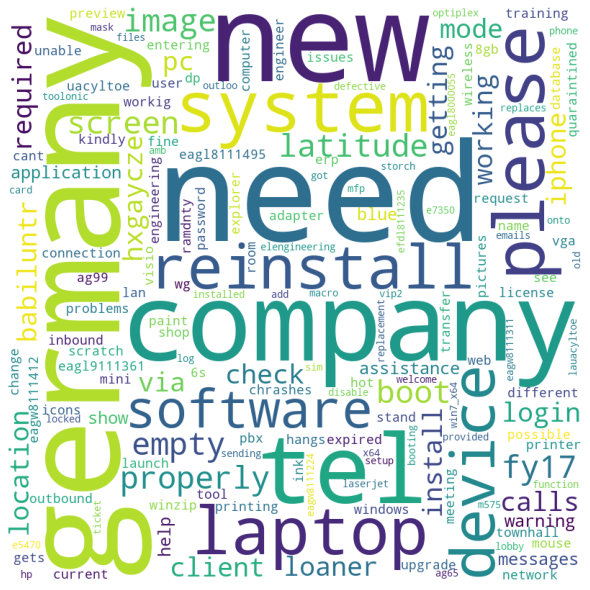

In [69]:
word_cl('GRP_28')

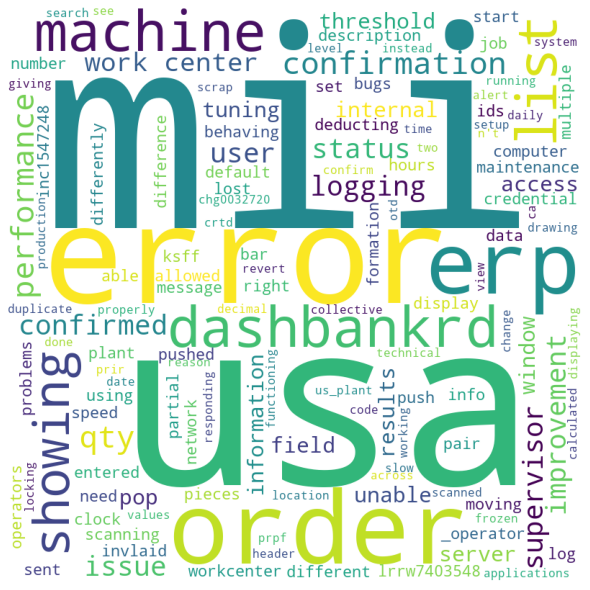

In [70]:
word_cl('GRP_41')

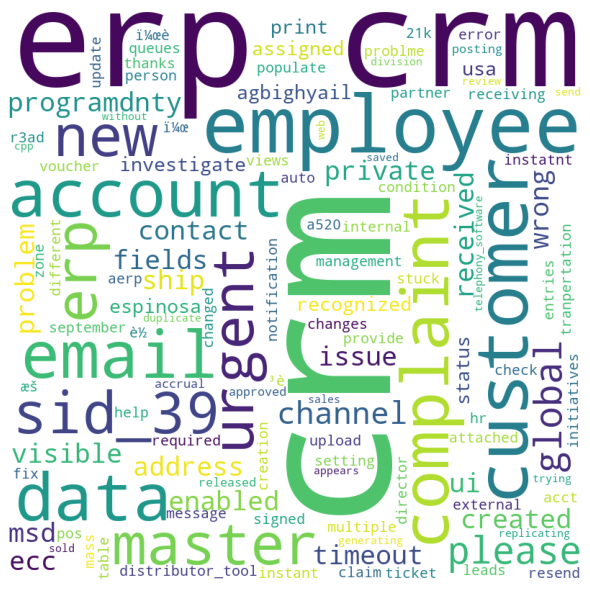

In [71]:
word_cl('GRP_15')

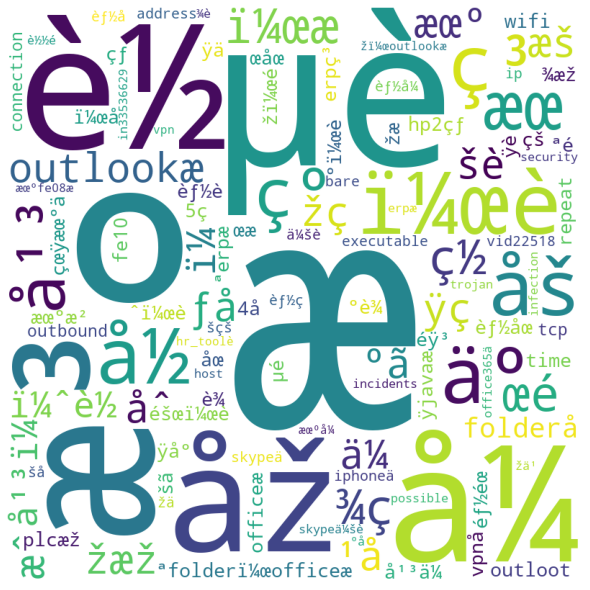

In [72]:
word_cl('GRP_30')

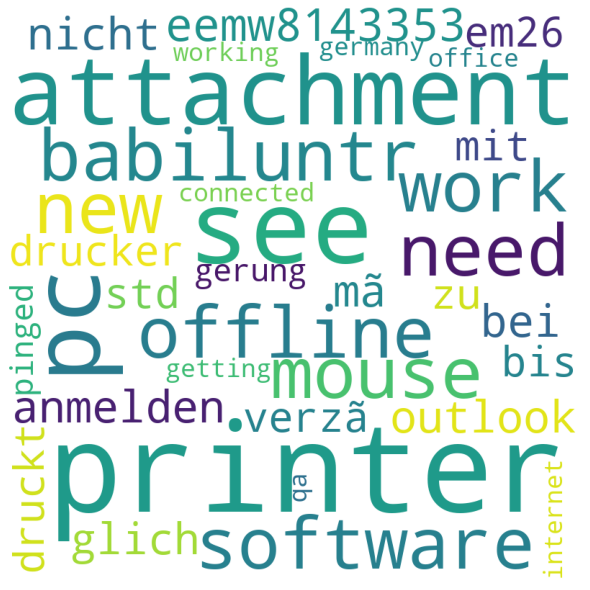

In [73]:
word_cl('GRP_42')

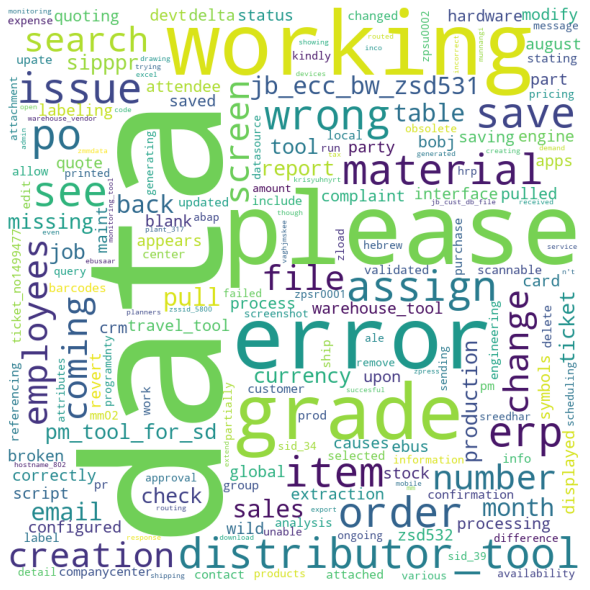

In [74]:
word_cl('GRP_20')

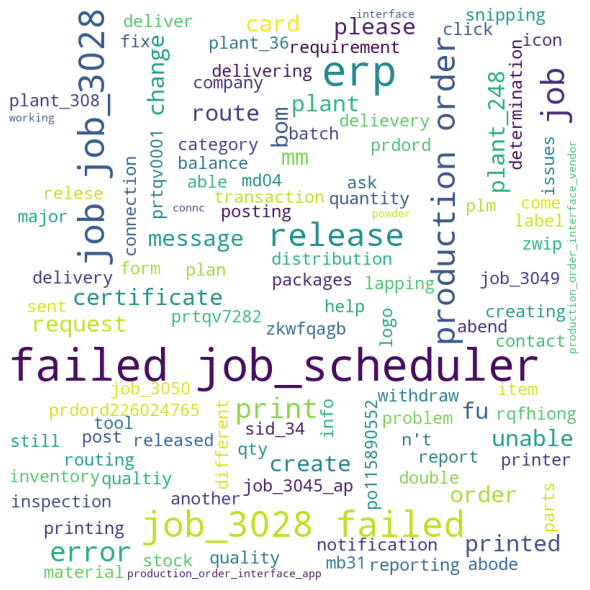

In [75]:
word_cl('GRP_45')

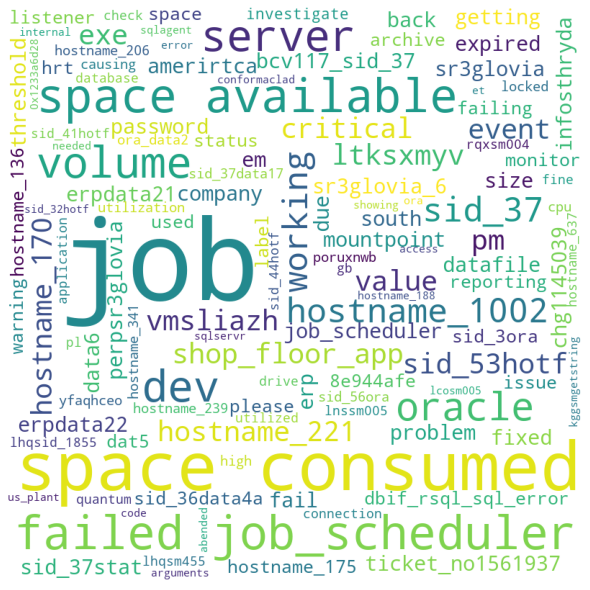

In [76]:
word_cl('GRP_1')